In [1]:
import sys
import os

repo_path = os.path.abspath(os.path.join(os.getcwd(), ".."))
sys.path.append(repo_path)

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns  # Add this import
from scipy import stats
from scipy.stats import skew
import matplotlib.pyplot as plt
from scipy.stats import kurtosis
from scipy.stats import jarque_bera

from src import portfolio_maker, agent
agentUSD = agent.PortfolioChangeAnalyzerUSD
HRP = portfolio_maker.HRP
#IVP = portfolio_maker.IVP
IVP = portfolio_maker.CVaR # replaced for simplicity
MVP = portfolio_maker.MVP

# Set options to display all columns and float format to 2 decimal places
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: f'{x:.2f}')

In [3]:
# Define functions to evaluate investment performance
def calculate_portfolio_returns(returns_matrix, weights):
    return (returns_matrix * weights).sum(axis=1)

def calculate_cumulative_returns(returns_matrix, weights):
    """
    Calculate cumulative returns for a portfolio given returns and weights.

    Parameters:
    - returns_matrix: DataFrame of asset returns
    - weights: Series of portfolio weights

    Returns:
    - Series of cumulative returns
    """
    portfolio_returns = calculate_portfolio_returns(returns_matrix, weights)
    cumulative_returns = (1 + portfolio_returns).cumprod()
    return cumulative_returns

def calculate_total_return(cumulative_returns):
    """Calculate total return over the entire period"""
    return cumulative_returns.iloc[-1] - 1

def calculate_roi(cumulative_returns):
    """Calculate Return on Investment (ROI) as percentage"""
    return (cumulative_returns.iloc[-1] - 1) * 100

def calculate_annualized_volatility(returns, periods_per_year=365):
    """Calculate annualized volatility"""
    return returns.std() * np.sqrt(periods_per_year)

def calculate_sharpe_ratio(returns, risk_free_rate=0, periods_per_year=365):
    """
    Calculate Sharpe Ratio
    Default risk-free rate of 0% and 365 trading days per year
    """
    excess_returns = returns - risk_free_rate/periods_per_year
    return np.sqrt(periods_per_year) * (excess_returns.mean() / returns.std())

def calculate_sortino_ratio(returns, risk_free_rate=0, periods_per_year=365):
    """Calculate Sortino Ratio using only downside volatility"""
    excess_returns = returns - risk_free_rate/periods_per_year
    downside_returns = returns[returns < 0]
    downside_std = np.sqrt(np.mean(downside_returns**2))
    return np.sqrt(periods_per_year) * (excess_returns.mean() / downside_std)

def calculate_drawdowns(cumulative_returns):
    """Calculate drawdown series"""
    rolling_max = cumulative_returns.expanding().max()
    drawdowns = cumulative_returns/rolling_max - 1
    return drawdowns

def calculate_max_drawdown(cumulative_returns):
    """Calculate Maximum Drawdown"""
    drawdowns = calculate_drawdowns(cumulative_returns)
    return drawdowns.min()

def calculate_calmar_ratio(returns, cumulative_returns, periods_per_year=365):
    """Calculate Calmar Ratio (annualized return / max drawdown)"""
    annualized_return = (cumulative_returns.iloc[-1]**(periods_per_year/len(returns)) - 1)
    max_drawdown = abs(calculate_max_drawdown(cumulative_returns))
    return annualized_return / max_drawdown

def calculate_cagr(cumulative_returns, periods_per_year=365):
    """Calculate Compound Annual Growth Rate (CAGR)"""
    total_periods = len(cumulative_returns)
    years = total_periods / periods_per_year
    cagr = (cumulative_returns.iloc[-1] ** (1 / years)) - 1
    return cagr

def calculate_performance_metrics(returns_matrix=None, weights=None, portfolio_returns=None, cumulative_returns=None):
    """
    Calculate comprehensive performance metrics for a portfolio
    
    Parameters:
    - returns_matrix: DataFrame of asset returns (optional if portfolio_returns and cumulative_returns provided)
    - weights: Series of portfolio weights (optional if portfolio_returns and cumulative_returns provided)
    - portfolio_returns: Series of portfolio returns (optional if returns_matrix and weights provided)
    - cumulative_returns: Series of cumulative returns (optional if returns_matrix and weights provided)
    
    Returns:
    - Dictionary containing all performance metrics
    """
    if portfolio_returns is None or cumulative_returns is None:
        if returns_matrix is None or weights is None:
            raise ValueError("Must provide either (returns_matrix, weights) or (portfolio_returns, cumulative_returns)")
        portfolio_returns = (returns_matrix * weights).sum(axis=1)
        cumulative_returns = calculate_cumulative_returns(returns_matrix, weights)
    
    metrics = {
        'Total Return (%)': float(calculate_roi(cumulative_returns)),
        'CAGR (%)': float(calculate_cagr(cumulative_returns) * 100),
        'Annualized Volatility (%)': float(calculate_annualized_volatility(portfolio_returns) * 100),
        'Sharpe Ratio': float(calculate_sharpe_ratio(portfolio_returns)),
        'Sortino Ratio': float(calculate_sortino_ratio(portfolio_returns)), 
        'Maximum Drawdown (%)': float(calculate_max_drawdown(cumulative_returns) * 100),
        'Calmar Ratio': float(calculate_calmar_ratio(portfolio_returns, cumulative_returns))
    }
    
    return metrics

def plot_performance_metrics(metrics_dict):
    """
    Plot performance metrics using a heatmap visualization with individual colormaps per metric
    
    Parameters:
    - metrics_dict: Dictionary containing performance metrics for different portfolios
    """
    # Get metrics names and prepare data for plotting
    metrics_names = list(next(iter(metrics_dict.values())).keys())
    portfolios = list(metrics_dict.keys())
    
    # Create figure with subplots for each metric
    fig, axes = plt.subplots(1, len(metrics_names), figsize=(14, 8))
    
    # Define different colormaps for different types of metrics
    colormaps = {
        'Total Return (%)': 'RdYlGn',  # Green is good for returns
        'Annualized Volatility (%)': 'RdYlGn_r',  # Red is good for lower volatility
        'Sharpe Ratio': 'RdYlGn',  # Green is good for risk-adjusted returns
        'Sortino Ratio': 'RdYlGn', # Green is good for downside risk-adjusted returns
        'Maximum Drawdown (%)': 'RdYlGn',  # Red is good (less negative) for drawdowns
        'Calmar Ratio': 'RdYlGn',  # Green is good for risk-adjusted returns
        'default': 'RdYlGn'  # Default colormap
    }
    
    # Plot each metric in its own subplot
    for idx, metric in enumerate(metrics_names):
        # Extract data for this metric
        data = [[metrics_dict[portfolio][metric]] for portfolio in portfolios]
        data = np.array(data)
        
        # Get appropriate colormap
        cmap = colormaps.get(metric, colormaps['default'])
        
        # Create heatmap
        im = axes[idx].imshow(data, aspect='auto', cmap=cmap)
        
        # Set ticks and labels
        axes[idx].set_yticks(np.arange(len(portfolios)))
        if idx == 0:  # Only show portfolio names on leftmost subplot
            axes[idx].set_yticklabels(portfolios)
        else:
            axes[idx].set_yticklabels([])
            
        axes[idx].set_xticks([])
        axes[idx].set_title(metric)
        
        # Add value annotations
        for i in range(len(portfolios)):
            text = axes[idx].text(0, i, f'{data[i, 0]:.2f}',
                                ha="center", va="center", color="black")
    
    plt.suptitle('Portfolio Performance Metrics Comparison')
    plt.tight_layout()
    return plt

In [4]:
# Load DataFrame
data = pd.read_csv(os.path.join('..','data','binance_usdt_pairs_2018-12-31_2024-01-01_1d.csv'))
data['open_time'] = pd.to_datetime(data['open_time'])
print(data.shape)
data.head()

(426165, 13)


,symbol,open_time,open,high,low,close,volume,close_time,quote_volume,num_trades,taker_base_vol,taker_quote_vol,ignore
0,1000SATSUSDT,2023-12-12,0.00,0.00,0.00,0.00,624844140259.00,2023-12-12 23:59:59.999,340399289.88,995522,318852251409.00,174388930.76,0
1,1000SATSUSDT,2023-12-13,0.00,0.00,0.00,0.00,317546611755.00,2023-12-13 23:59:59.999,157167392.37,444221,158103387848.00,78333443.71,0
2,1000SATSUSDT,2023-12-14,0.00,0.00,0.00,0.00,778688810259.00,2023-12-14 23:59:59.999,511889240.81,1390517,399140907213.00,262301084.13,0
3,1000SATSUSDT,2023-12-15,0.00,0.00,0.00,0.00,902204913462.00,2023-12-15 23:59:59.999,732922339.08,2325998,450689519636.00,367398491.91,0
4,1000SATSUSDT,2023-12-16,0.00,0.00,0.00,0.00,405020284175.00,2023-12-16 23:59:59.999,312792279.99,940263,196177438805.00,151753298.50,0


#### Filtramos los datos para eliminar los pares de stablecoins

In [5]:
# list of stablecoin pairs and forex pairs
stablecoin_pairs = [
    'USDCUSDT',    # USD Coin
    'BUSDUSDT',    # Binance USD
    'DAIUSDT',     # DAI
    'TUSDUSDT',    # True USD
    'USDPUSDT',    # Pax Dollar
    'GUSDUSDT',    # Gemini Dollar
    'FDUSDT',      # First Digital USD
    'PYUSDUSDT',   # PayPal USD
    'LUSDUSDT',    # Liquity USD
    'USDSUSDT',    # Stably USD
    'SUSDUSDT',    # sUSD (Synthetix USD)
    'CUSDUSDT',    # Celo Dollar
    'USDXUSDT',    # USDX [Kava]
    'FRAXUSDT',    # Frax
    'USDDUSDT',    # USDD
    'FDUSDUSDT',   # First Digital USD
    'PAXUSDT',     # Paxos Standard
    'USDSBUSDT'    # StableUSD (USDS)
]

# Filter data for non-stablecoin pairs
filtered_data = data[~data['symbol'].isin(stablecoin_pairs)]

# Sort table by open_time, ascending, and reset index
filtered_data = filtered_data.sort_values(by='open_time', ascending=True).reset_index(drop=True)

print(filtered_data.shape)
filtered_data.head()

(418366, 13)


,symbol,open_time,open,high,low,close,volume,close_time,quote_volume,num_trades,taker_base_vol,taker_quote_vol,ignore
0,QTUMUSDT,2019-01-01,2.12,2.25,2.10,2.23,110950.42,2019-01-01 23:59:59.999,239699.45,2615,59529.42,128789.92,0
1,BCHSVUSDT,2019-01-01,83.88,94.88,83.23,90.79,164228.86,2019-01-01 23:59:59.999,14825047.18,51919,80107.53,7228702.47,0
2,BTCUSDT,2019-01-01,3701.23,3810.16,3642.00,3797.14,23741.69,2019-01-01 23:59:59.999,88149249.09,154227,12919.16,47973435.87,0
3,NEOUSDT,2019-01-01,7.42,7.79,7.28,7.76,324745.14,2019-01-01 23:59:59.999,2430436.39,8615,161815.74,1212410.89,0
4,ETCUSDT,2019-01-01,4.98,5.25,4.93,5.25,261033.68,2019-01-01 23:59:59.999,1321405.06,6415,141648.99,718234.40,0


In [6]:
# Make a series with the weights of the buy and hold strategy
hodl_BTC = pd.Series({'BTCUSDT': 1.0})
hodl_ETH = pd.Series({'ETHUSDT': 1.0})

#### Separamos los retornos de los primeros 2 años para armar el portafolio

In [7]:
# Transform data to returns and drop pairs with insufficient data
returns = (
    filtered_data
    .pivot(
        columns='symbol',
        values='close',
        index='open_time'
    )
    .iloc[:365*2+1]  # Keep first 2 years of daily data (+1)
    .pct_change(fill_method=None)
    .iloc[1:]  # Drop first row
    .dropna(axis=1, how='any')  # Drop columns with any NaN values after the first row drop
)
print(returns.shape)
returns.head()

(730, 17)


symbol,ADAUSDT,BNBUSDT,BTCUSDT,EOSUSDT,ETCUSDT,ETHUSDT,ICXUSDT,IOTAUSDT,LTCUSDT,NEOUSDT,NULSUSDT,ONTUSDT,QTUMUSDT,TRXUSDT,VETUSDT,XLMUSDT,XRPUSDT
open_time,,,,,,,,,,,,,,,,,
2019-01-02,0.06,0.01,0.02,0.08,0.01,0.09,0.04,0.06,0.04,0.02,0.03,0.06,0.04,0.02,0.01,0.03,0.02
2019-01-03,-0.05,-0.04,-0.02,-0.06,-0.06,-0.04,0.03,-0.04,-0.04,-0.05,-0.03,-0.06,-0.06,-0.00,-0.04,-0.04,-0.04
2019-01-04,0.02,0.03,0.01,0.01,0.04,0.04,0.05,-0.00,0.01,-0.01,0.02,0.01,0.02,0.07,0.01,0.01,0.00
2019-01-05,0.02,-0.00,-0.01,-0.01,-0.03,0.01,-0.02,-0.01,0.08,0.04,0.04,0.03,0.00,0.04,-0.01,-0.01,-0.01
2019-01-06,0.10,0.05,0.06,0.06,0.06,0.01,0.07,0.02,0.12,0.10,0.03,0.04,0.04,0.03,0.06,0.06,0.03


In [8]:
# Create a file with the returns of the first 2 years to plot correlation matrix with dendrogram on colab
output_file = f'only_first_2_years_returns.csv'

# Check if file exists, if not then collect historical data from Binance API
if not os.path.exists(os.path.join('..','data',output_file)):
    returns.to_csv(os.path.join('..','data',output_file))

#### Distribución de los retornos

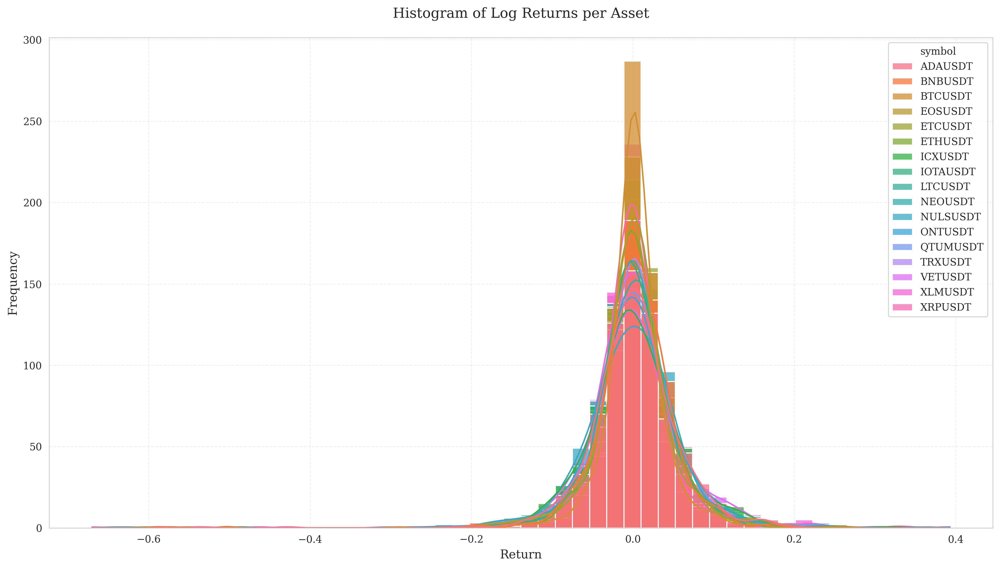

In [9]:
# Calculate log returns
log_returns = np.log(1 + returns)

sns.set_style("whitegrid", {'grid.linestyle': '--'})
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14

fig, ax = plt.subplots(figsize=(14, 8), dpi=300)
sns.histplot(data=log_returns, bins=50, kde=True, alpha=0.75)

# Customize plot elements
ax.set_title("Histogram of Log Returns per Asset", 
            pad=20)
ax.set_xlabel("Return")
ax.set_ylabel("Frequency")

# Customize grid
ax.grid(True, linestyle='--', alpha=0.3)

# Adjust layout and display
plt.tight_layout()
plt.show()

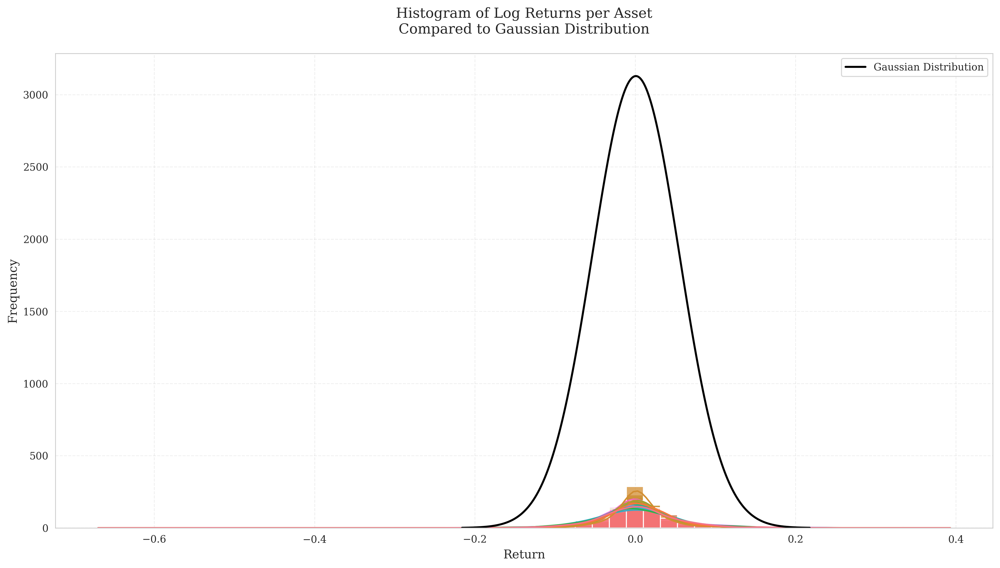

In [10]:
# Calculate log returns
log_returns = np.log(1 + returns)

sns.set_style("whitegrid", {'grid.linestyle': '--'})
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14

fig, ax = plt.subplots(figsize=(14, 8), dpi=300)
sns.histplot(data=log_returns, bins=50, kde=True, alpha=0.75)

################################### <- aux
# Add Gaussian normal distribution curve
# Calculate mean and standard deviation for the normal distribution
mean = log_returns.stack().mean()
std = log_returns.stack().std()
x = np.linspace(mean - 4*std, mean + 4*std, 1000)
y = stats.norm.pdf(x, mean, std)

# Scale the normal distribution to match the histogram height
hist_heights, _ = np.histogram(log_returns.stack(), bins=50)
scaling_factor = max(hist_heights) / max(y)
ax.plot(x, y * scaling_factor, 'k-', linewidth=2, label='Gaussian Distribution')
################################### <- aux

# Customize plot elements
ax.set_title("Histogram of Log Returns per Asset\nCompared to Gaussian Distribution", 
            pad=20)
ax.set_xlabel("Return")
ax.set_ylabel("Frequency")
################################### <- aux
ax.legend()
################################### <- aux

# Customize grid
ax.grid(True, linestyle='--', alpha=0.3)

# Adjust layout and display
plt.tight_layout()
plt.show()

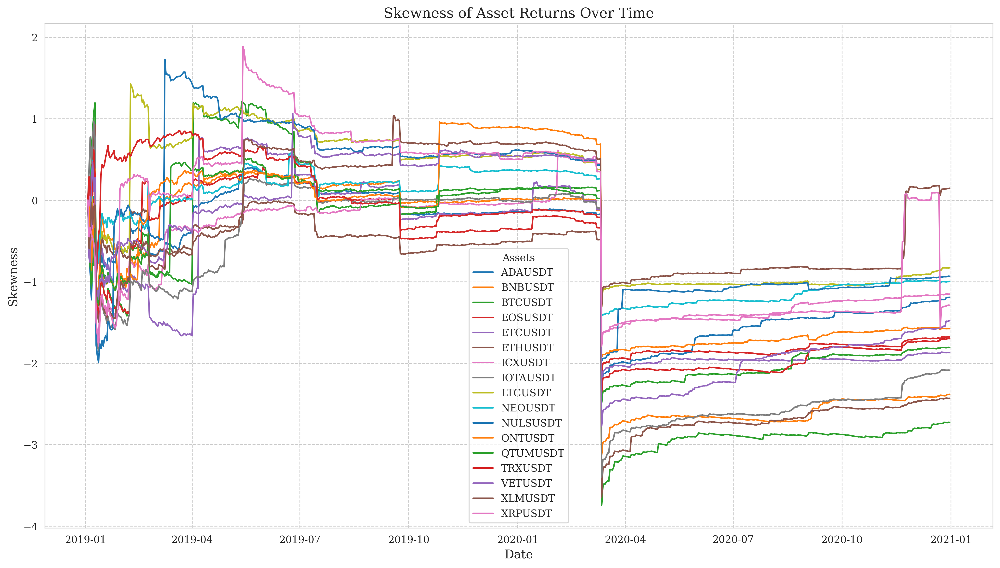

In [11]:
sns.set_style("whitegrid", {'grid.linestyle': '--'})
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14

fig, ax = plt.subplots(figsize=(14, 8), dpi=300)

# This calculates skewness for each asset by incrementally including more data points over time
# For each date, it computes skewness using all available data from the beginning up to that date
# The expanding() method creates a window that grows with each observation
# The apply() with skew() calculates the skewness statistic for each window
# raw=True improves performance by operating on numpy arrays instead of pandas objects
skewness = log_returns.expanding().apply(lambda x: skew(x), raw=True)

# Plot skewness as a lineplot
for column in skewness.columns:
    ax.plot(skewness.index, skewness[column], label=column)

plt.xlabel("Date")
plt.ylabel("Skewness")
plt.title("Skewness of Asset Returns Over Time")
plt.legend(title="Assets")
plt.tight_layout()
plt.show()

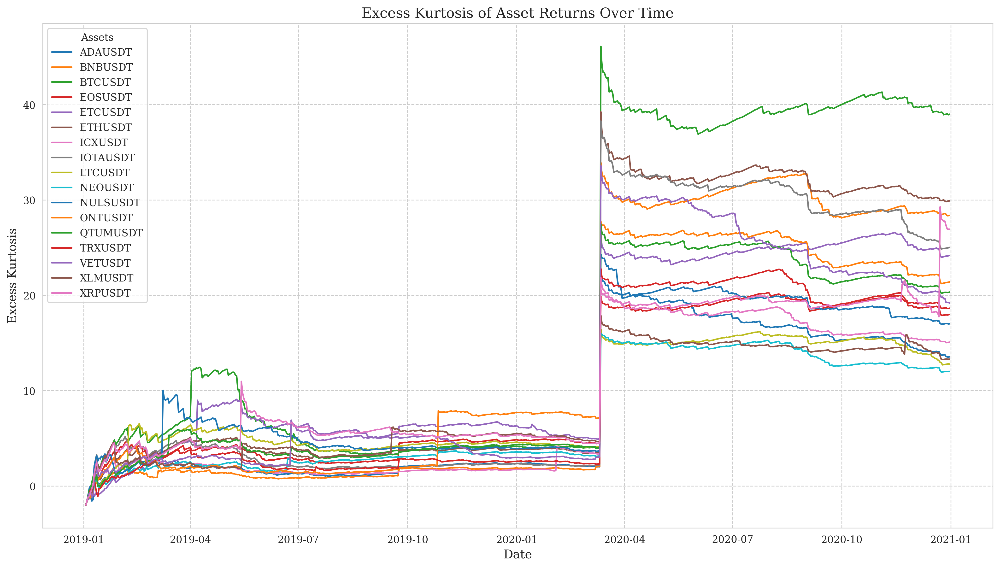

In [12]:
sns.set_style("whitegrid", {'grid.linestyle': '--'})
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14

fig, ax = plt.subplots(figsize=(14, 8), dpi=300)

# This calculates excess kurtosis for each asset by incrementally including more data points over time
# For each date, it computes excess kurtosis using all available data from the beginning up to that date
# The expanding() method creates a window that grows with each observation
# The apply() with kurtosis() calculates the excess kurtosis statistic for each window
# fisher=True ensures we get excess kurtosis (kurtosis - 3), which is 0 for normal distribution
# raw=True improves performance by operating on numpy arrays instead of pandas objects
excess_kurt = log_returns.expanding().apply(lambda x: kurtosis(x, fisher=True), raw=True)

# Plot excess kurtosis as a lineplot
for column in excess_kurt.columns:
    ax.plot(excess_kurt.index, excess_kurt[column], label=column)

plt.xlabel("Date")
plt.ylabel("Excess Kurtosis")
plt.title("Excess Kurtosis of Asset Returns Over Time")
plt.legend(title="Assets")
plt.tight_layout()
plt.show()

<Figure size 4200x2400 with 0 Axes>

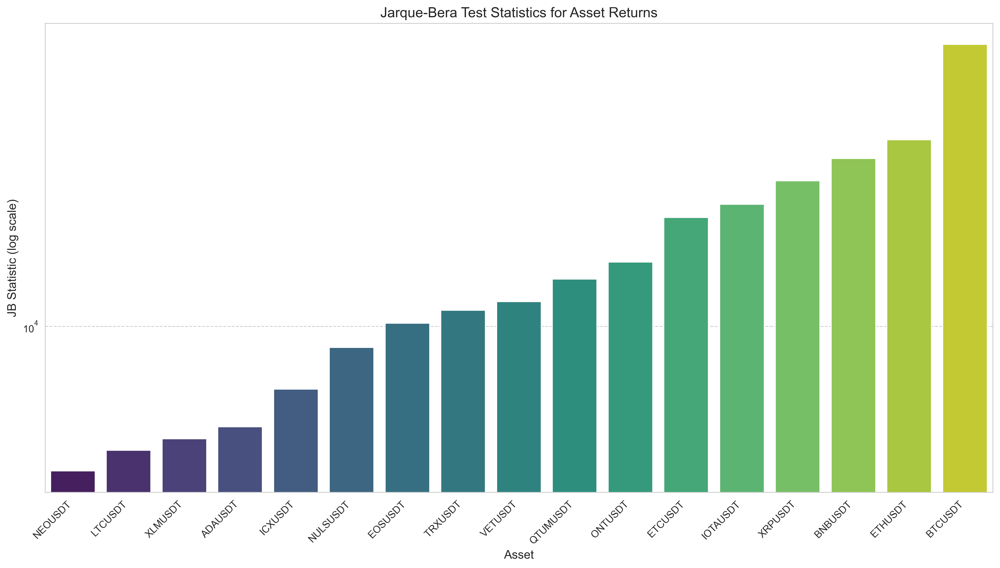

Jarque-Bera Test Results:
   Asset  JB Statistic  p-value  Normality
 NEOUSDT       4511.12     0.00      False
 LTCUSDT       5053.38     0.00      False
 XLMUSDT       5385.08     0.00      False
 ADAUSDT       5750.59     0.00      False
 ICXUSDT       7080.48     0.00      False
NULSUSDT       8905.09     0.00      False
 EOSUSDT      10178.39     0.00      False
 TRXUSDT      10924.49     0.00      False
 VETUSDT      11452.08     0.00      False
QTUMUSDT      12975.34     0.00      False
 ONTUSDT      14238.74     0.00      False
 ETCUSDT      18211.07     0.00      False
IOTAUSDT      19578.08     0.00      False
 XRPUSDT      22263.77     0.00      False
 BNBUSDT      25178.04     0.00      False
 ETHUSDT      27927.57     0.00      False
 BTCUSDT      47165.71     0.00      False

Note: p-value > 0.05 suggests the distribution might be normal
All assets with p-value < 0.05 reject the null hypothesis of normality


In [13]:
# Perform Jarque-Bera test for normality on log returns

# Create a figure to display the Jarque-Bera test results
plt.figure(figsize=(14, 8), dpi=300)

# Dictionary to store test results
jb_results = {}
jb_pvalues = {}

# Perform Jarque-Bera test on each asset's log returns
for column in log_returns.columns:
    # Remove NaN values
    data = log_returns[column].dropna()
    
    # Calculate Jarque-Bera statistic and p-value
    jb_stat, p_value = jarque_bera(data)
    
    # Store results
    jb_results[column] = jb_stat
    jb_pvalues[column] = p_value

# Convert results to DataFrames for easier visualization
jb_stats_df = pd.DataFrame({
    'Asset': list(jb_results.keys()),
    'JB Statistic': list(jb_results.values()),
    'p-value': list(jb_pvalues.values()),
    'Normality': [p_value > 0.05 for p_value in jb_pvalues.values()]
})

# Sort by JB statistic for better visualization
jb_stats_df = jb_stats_df.sort_values('JB Statistic')

# Create a bar plot for JB statistics
plt.figure(figsize=(14, 8), dpi=300)
sns.set_style("whitegrid", {'grid.linestyle': '--'})
# Fixed the deprecated warning by assigning 'Asset' to hue and setting legend=False
ax = sns.barplot(x='Asset', y='JB Statistic', hue='Asset', data=jb_stats_df, palette='viridis', legend=False)
plt.yscale('log')  # Log scale for better visualization of large differences
plt.xticks(rotation=45, ha='right')
plt.title('Jarque-Bera Test Statistics for Asset Returns')
plt.ylabel('JB Statistic (log scale)')
plt.xlabel('Asset')
plt.tight_layout()
plt.show()

# Print the detailed results
print("Jarque-Bera Test Results:")
print(jb_stats_df.to_string(index=False))
print("\nNote: p-value > 0.05 suggests the distribution might be normal")
print("All assets with p-value < 0.05 reject the null hypothesis of normality")

#### Distribución de los retornos promedio de acumulación de periodos

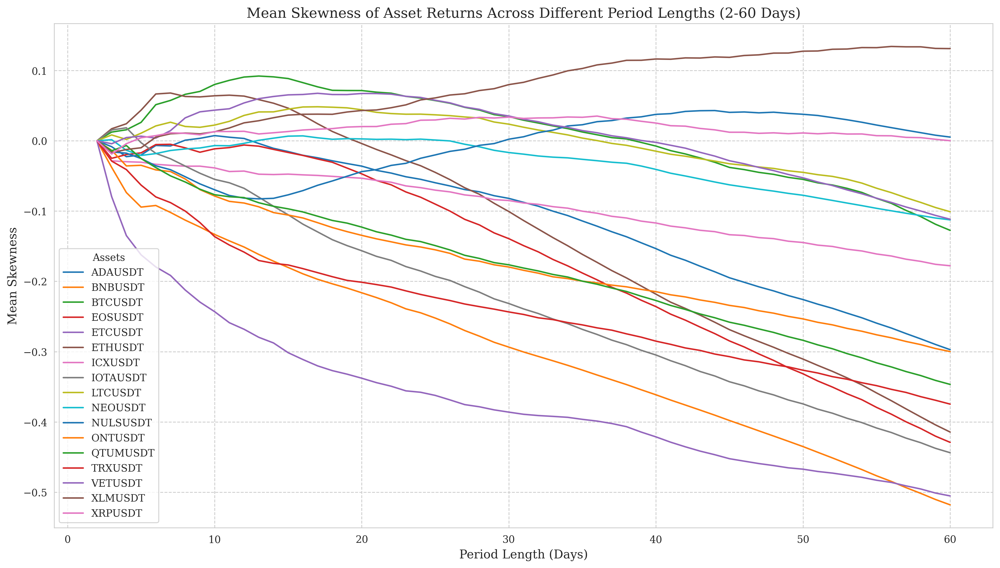

In [14]:
sns.set_style("whitegrid", {'grid.linestyle': '--'})
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14

fig, ax = plt.subplots(figsize=(14, 8), dpi=300)

# Define the range of periods to calculate skewness for
periods = list(range(2, 61))
period_skewness = {}

# Calculate mean skewness for each period length
for period in periods:
    # Calculate rolling skewness for each asset with the current period length
    rolling_skew = log_returns.rolling(window=period, min_periods=max(2, int(period/2))).apply(lambda x: skew(x), raw=True)
    
    # Calculate the mean skewness across all dates for each asset
    mean_skew = rolling_skew.mean()
    
    # Store the results in the dictionary
    period_skewness[period] = mean_skew

# Convert the results to a DataFrame for easier plotting
skewness_df = pd.DataFrame(period_skewness)

# Plot mean skewness for each asset across different periods
for asset in skewness_df.index:
    ax.plot(periods, skewness_df.loc[asset], label=asset)

plt.xlabel("Period Length (Days)")
plt.ylabel("Mean Skewness")
plt.title("Mean Skewness of Asset Returns Across Different Period Lengths (2-60 Days)")
plt.legend(title="Assets")
plt.tight_layout()
plt.show()

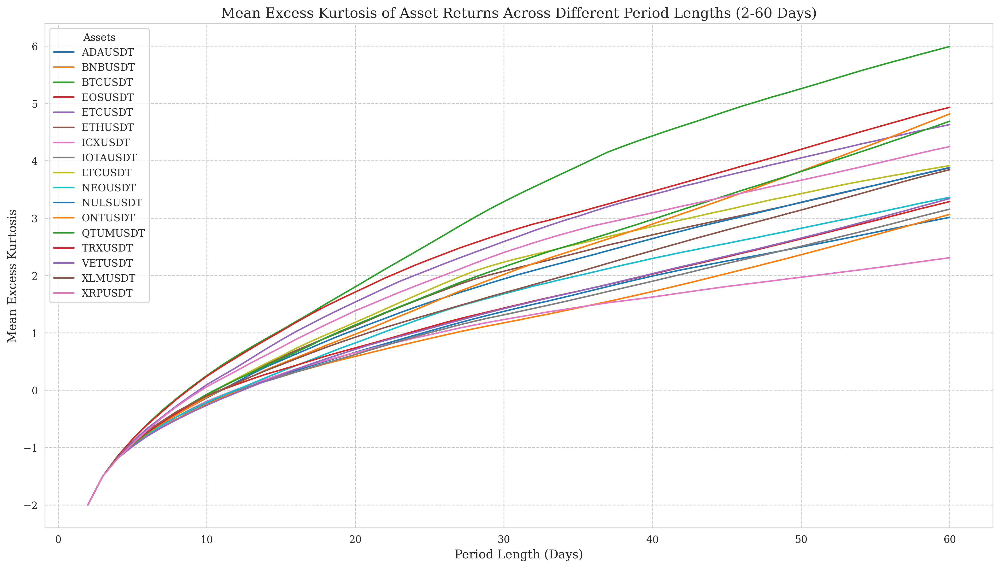

In [15]:
sns.set_style("whitegrid", {'grid.linestyle': '--'})
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14

fig, ax = plt.subplots(figsize=(14, 8), dpi=300)

# Define the range of periods to calculate kurtosis for
periods = list(range(2, 61))
period_kurtosis = {}

# Calculate mean kurtosis for each period length
for period in periods:
    # Calculate rolling kurtosis for each asset with the current period length
    rolling_kurt = log_returns.rolling(window=period, min_periods=max(2, int(period/2))).apply(lambda x: kurtosis(x, fisher=True), raw=True)
    
    # Calculate the mean kurtosis across all dates for each asset
    mean_kurt = rolling_kurt.mean()
    
    # Store the results in the dictionary
    period_kurtosis[period] = mean_kurt

# Convert the results to a DataFrame for easier plotting
kurtosis_df = pd.DataFrame(period_kurtosis)

# Plot mean kurtosis for each asset across different periods
for asset in kurtosis_df.index:
    ax.plot(periods, kurtosis_df.loc[asset], label=asset)

plt.xlabel("Period Length (Days)")
plt.ylabel("Mean Excess Kurtosis")
plt.title("Mean Excess Kurtosis of Asset Returns Across Different Period Lengths (2-60 Days)")
plt.legend(title="Assets")
plt.tight_layout()
plt.show()

#### Armamos los portafolios estaticos y evaluamos su performance

In [16]:
hrp_strategy = HRP(returns)
hrp_weights = hrp_strategy.get_weights()

ivp_strategy = IVP(returns)
ivp_weights = ivp_strategy.get_weights()

mvp_strategy = MVP(returns)
mvp_weights = mvp_strategy.get_weights()

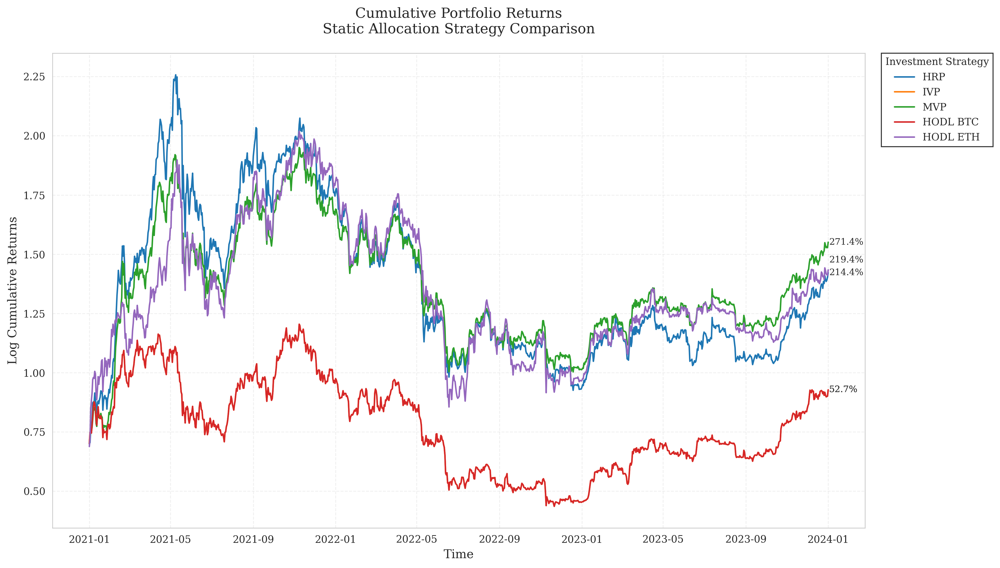

In [17]:
# Transform data to returns
backtest_returns = (
    filtered_data
    .pivot(
        columns='symbol',
        values='close',
        index='open_time'
    )
    .iloc[365*2:]  # Get data after first 2 years of daily data
    .pct_change(fill_method=None)
    .iloc[1:]  # Drop first row
)

# Filter and sort backtest_returns in order to match returns used for the strategies
backtest_returns = backtest_returns[returns.columns]

# Calculate cumulative returns for portfolio strategies
hrp_cumulative = calculate_cumulative_returns(backtest_returns, hrp_weights)
ivp_cumulative = calculate_cumulative_returns(backtest_returns, ivp_weights)
mvp_cumulative = calculate_cumulative_returns(backtest_returns, mvp_weights)

# Calculate cumulative returns for HODL strategies
btc_cumulative = calculate_cumulative_returns(backtest_returns, hodl_BTC)
eth_cumulative = calculate_cumulative_returns(backtest_returns, hodl_ETH)

cumulative_returns = pd.DataFrame({
    "HRP": hrp_cumulative,
    "IVP": ivp_cumulative,
    "MVP": mvp_cumulative,
    "HODL BTC": btc_cumulative,
    "HODL ETH": eth_cumulative
})

# Set style for scientific publication
#plt.style.use('seaborn-whitegrid')
sns.set_style("whitegrid", {'grid.linestyle': '--'})
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14

# Create figure with specific dimensions for publication
fig, ax = plt.subplots(figsize=(14, 8), dpi=300)

# Plot cumulative returns with professional color scheme
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
for i, col in enumerate(cumulative_returns.columns):
    line = ax.plot(cumulative_returns.index, 
                  np.log1p(cumulative_returns[col]), 
                  label=col,
                  color=colors[i],
                  linewidth=1.5)
    
    # Add final value annotation with scientific notation
    final_value = (cumulative_returns[col].iloc[-1] - 1) * 100
    
    # Add vertical offset for HODL ETH annotation to avoid overlap
    y_offset = 0
    if col == "HODL ETH":
        y_offset = 10
        
    ax.annotate(f'{final_value:.1f}%', 
                xy=(cumulative_returns.index[-1], 
                    np.log1p(cumulative_returns[col].iloc[-1])),
                xytext=(1, y_offset),
                textcoords='offset points',
                va='center',
                fontsize=9)

# Customize plot elements
ax.set_title("Cumulative Portfolio Returns\nStatic Allocation Strategy Comparison", 
            pad=20)
ax.set_xlabel("Time")
ax.set_ylabel("Log Cumulative Returns")

# Customize grid
ax.grid(True, linestyle='--', alpha=0.3)

# Customize legend
ax.legend(title="Investment Strategy", 
         bbox_to_anchor=(1.02, 1),
         loc='upper left',
         borderaxespad=0,
         frameon=True,
         fancybox=False,
         edgecolor='black')

# Adjust layout and display
plt.tight_layout()
plt.show()

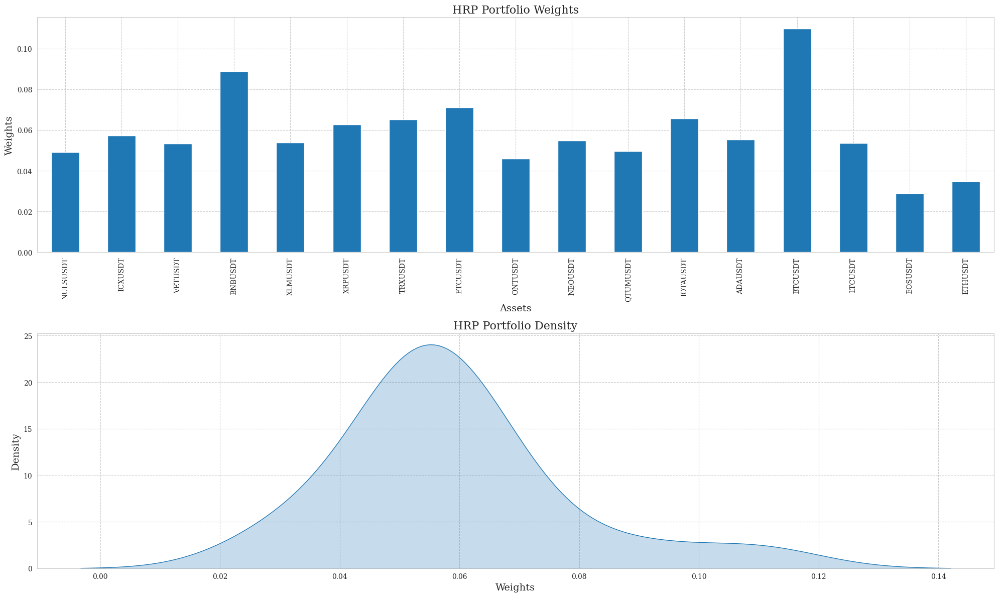

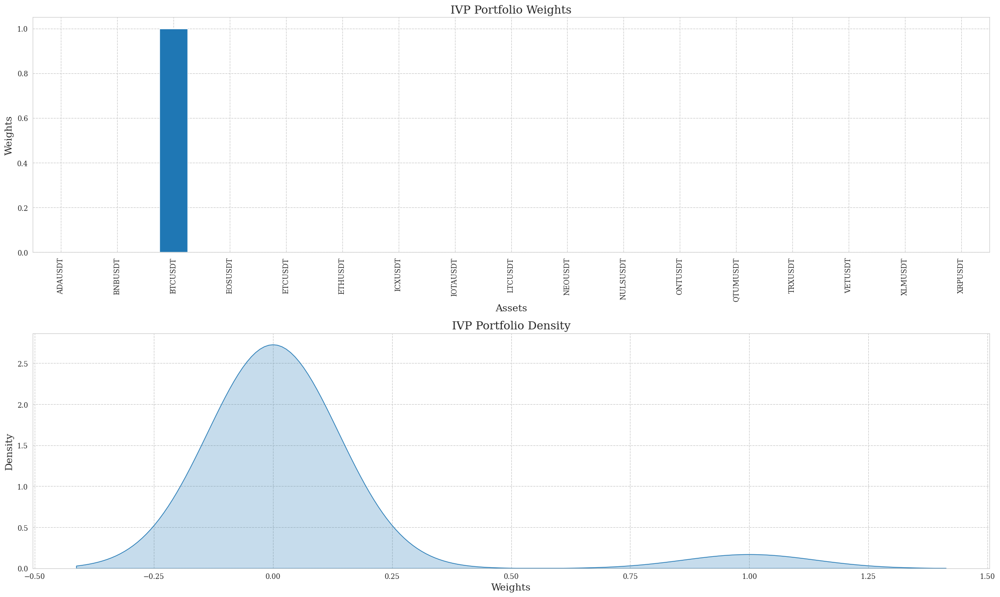

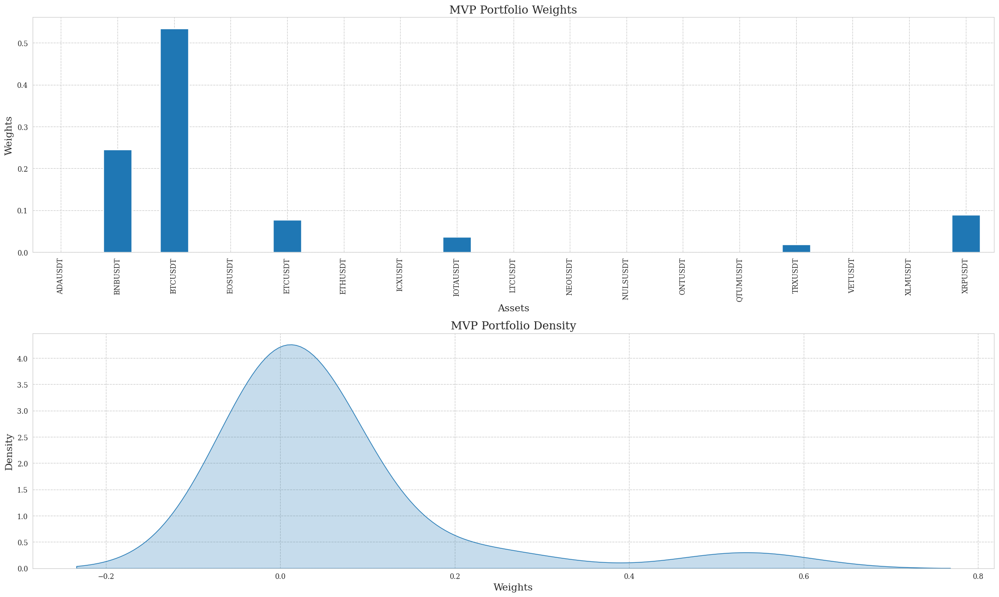

In [18]:
strategies = {"HRP": hrp_weights, "IVP": ivp_weights, "MVP": mvp_weights}

for strategy, weights in strategies.items():
    fig, axes = plt.subplots(2, 1, figsize=(20, 12))
    
    weights.plot(kind="bar", ax=axes[0])
    axes[0].set_title(f"{strategy} Portfolio Weights", fontsize=16)
    axes[0].set_xlabel("Assets", fontsize=14)
    axes[0].set_ylabel("Weights", fontsize=14)
    
    sns.kdeplot(weights, ax=axes[1], fill=True)
    axes[1].set_title(f"{strategy} Portfolio Density", fontsize=16)
    axes[1].set_xlabel("Weights", fontsize=14)
    axes[1].set_ylabel("Density", fontsize=14)
    
    plt.tight_layout()
    plt.show()

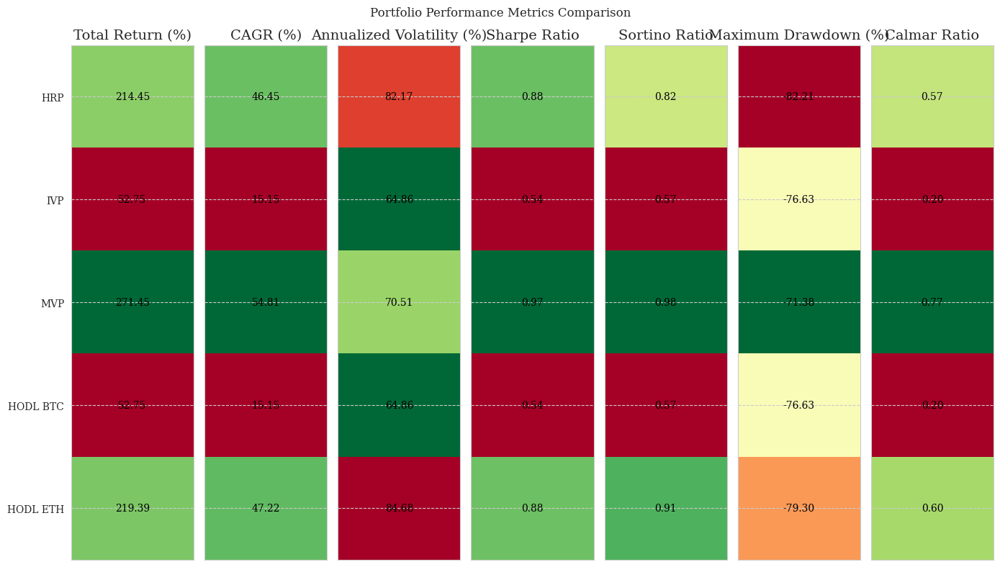

In [19]:
# calculate_performance_metrics(returns_matrix=None, weights=None, portfolio_returns=None, cumulative_returns=None)

# Calculate portfolio returns for all strategies including HODL
btc_returns = calculate_portfolio_returns(backtest_returns, hodl_BTC)
eth_returns = calculate_portfolio_returns(backtest_returns, hodl_ETH)

metrics_dict = {
    'HRP': calculate_performance_metrics(returns_matrix=backtest_returns, weights=hrp_weights),
    'IVP': calculate_performance_metrics(returns_matrix=backtest_returns, weights=ivp_weights),
    'MVP': calculate_performance_metrics(returns_matrix=backtest_returns, weights=mvp_weights),
    'HODL BTC': calculate_performance_metrics(portfolio_returns=btc_returns, cumulative_returns=btc_cumulative),
    'HODL ETH': calculate_performance_metrics(portfolio_returns=eth_returns, cumulative_returns=eth_cumulative)
}

plot_performance_metrics(metrics_dict);

#### Armamos portafolios dinamicos y evaluamos su performance
Rebalanceo cada 30 días con costos de transacción por USD

In [20]:
# Set the number of days for rebalancing and the window size for the dynamic strategies
rebalancing_days = 30 # days
window_size = 365*2 # 2 years of daily data

# Transform data to returns
backtest_returns = (
    filtered_data
    .pivot(
        columns='symbol',
        values='close',
        index='open_time'
    )
    .iloc[window_size:window_size+rebalancing_days+1]  # Get data for rebalancing days after window size (+1)
    .pct_change(fill_method=None)
    .iloc[1:]  # Drop first row
)

# Filter and sort backtest_returns in order to match returns used for the strategies
backtest_returns = backtest_returns[returns.columns]

# Calculate portfolio returns
hrp_returns = calculate_portfolio_returns(backtest_returns, hrp_weights)
ivp_returns = calculate_portfolio_returns(backtest_returns, ivp_weights)
mvp_returns = calculate_portfolio_returns(backtest_returns, mvp_weights)

portfolio_returns_dynamic = pd.DataFrame({
    "HRP": hrp_returns,
    "IVP": ivp_returns,
    "MVP": mvp_returns
})

# Calculate cumulative returns
hrp_cumulative = calculate_cumulative_returns(backtest_returns, hrp_weights)
ivp_cumulative = calculate_cumulative_returns(backtest_returns, ivp_weights)
mvp_cumulative = calculate_cumulative_returns(backtest_returns, mvp_weights)

cumulative_returns_dynamic = pd.DataFrame({
    "HRP": hrp_cumulative,
    "IVP": ivp_cumulative,
    "MVP": mvp_cumulative
})

# Calculate change between first day prices and final day prices of the backtest returns
first_day_prices = filtered_data.pivot(columns='symbol', values='close', index='open_time').loc[backtest_returns.index.min()]
final_day_prices = filtered_data.pivot(columns='symbol', values='close', index='open_time').loc[backtest_returns.index.max()]
price_change = final_day_prices / first_day_prices

# Calculate the new weights based on the price change
new_weights = {
    "HRP": hrp_weights * price_change[hrp_weights.index] / (hrp_weights * price_change[hrp_weights.index]).sum(),
    "IVP": ivp_weights * price_change[ivp_weights.index] / (ivp_weights * price_change[ivp_weights.index]).sum(),
    "MVP": mvp_weights * price_change[mvp_weights.index] / (mvp_weights * price_change[mvp_weights.index]).sum()
}

In [21]:
# Calculate number of possible periods
total_periods = (len(filtered_data['open_time'].unique()) - window_size - rebalancing_days) // rebalancing_days

# Initialize dictionaries to accumulate transactions and their costs for each strategy
total_transactions = {"HRP": 0, "IVP": 0, "MVP": 0}
total_costs = {"HRP": 0.0, "IVP": 0.0, "MVP": 0.0}

# Set old returns from the new weights
hrp_old = new_weights["HRP"].copy()
ivp_old = new_weights["IVP"].copy()
mvp_old = new_weights["MVP"].copy()

# For each period
for period in range(1, total_periods + 2): # start from the second period, add +2 to include the last period of backtest
    # Calculate window start and end indices
    window_start = period * rebalancing_days
    window_end = window_start + window_size
    backtest = window_end + rebalancing_days
    
    # Get returns data
    returns = (
        filtered_data
        .pivot(
            columns='symbol',
            values='close',
            index='open_time'
        )
        .iloc[window_start:window_end+1] # (+1)
        .pct_change(fill_method=None)
        .iloc[1:]  # Drop first row
        .dropna(axis=1, how='any')  # Drop any columns with missing data
    )
    
    # Calculate new weights using the returns data
    hrp_new = HRP(returns).get_weights()
    ivp_new = IVP(returns).get_weights()
    mvp_new = MVP(returns).get_weights()

    # Evaluate the transition for HRP strategy
    hrp_analyzer = agentUSD(hrp_old, hrp_new, returns)
    hrp_analysis = hrp_analyzer.analyze_transition(min_improvement_threshold=None)
    
    if hrp_analysis['recommendation']:
        total_transactions["HRP"] += 1
        total_costs["HRP"] += hrp_analysis['transaction_costs']
        cumulative_returns_dynamic.loc[cumulative_returns_dynamic.index.max(), 'HRP'] -= hrp_analysis['transaction_costs']
        hrp_old = hrp_new.copy()
    
    # Evaluate the transition for IVP strategy
    ivp_analyzer = agentUSD(ivp_old, ivp_new, returns)
    ivp_analysis = ivp_analyzer.analyze_transition(min_improvement_threshold=None)
    
    if ivp_analysis['recommendation']:
        total_transactions["IVP"] += 1
        total_costs["IVP"] += ivp_analysis['transaction_costs']
        cumulative_returns_dynamic.loc[cumulative_returns_dynamic.index.max(), 'IVP'] -= ivp_analysis['transaction_costs']
        ivp_old = ivp_new.copy()
    
    # Evaluate the transition for MVP strategy
    mvp_analyzer = agentUSD(mvp_old, mvp_new, returns)
    mvp_analysis = mvp_analyzer.analyze_transition(min_improvement_threshold=None)
    
    if mvp_analysis['recommendation']:
        total_transactions["MVP"] += 1
        total_costs["MVP"] += mvp_analysis['transaction_costs']
        cumulative_returns_dynamic.loc[cumulative_returns_dynamic.index.max(), 'MVP'] -= mvp_analysis['transaction_costs']
        mvp_old = mvp_new.copy()
    
    # Get backtest data
    backtest_returns = (
        filtered_data
        .pivot(
            columns='symbol',
            values='close',
            index='open_time'
        )
        .iloc[window_end:backtest+1] # (+1)
        .pct_change(fill_method=None)
        .iloc[1:] # Drop first row
    )
    
    # Align backtest data columns with the weights of each strategy
    hrp_backtest_returns = backtest_returns[hrp_old.index]
    ivp_backtest_returns = backtest_returns[ivp_old.index]
    mvp_backtest_returns = backtest_returns[mvp_old.index]
    
    # Calculate portfolio returns for this period
    hrp_ret = calculate_portfolio_returns(hrp_backtest_returns, hrp_old)
    ivp_ret = calculate_portfolio_returns(ivp_backtest_returns, ivp_old)
    mvp_ret = calculate_portfolio_returns(mvp_backtest_returns, mvp_old)

    portfolio_returns_together = pd.DataFrame({
        "HRP": hrp_ret,
        "IVP": ivp_ret,
        "MVP": mvp_ret
    })

    # Calculate cumulative returns for this period
    last_cum_return = cumulative_returns_dynamic.iloc[-1] if not cumulative_returns_dynamic.empty else pd.Series({"HRP": 1, "IVP": 1, "MVP": 1})
    
    hrp_cum = calculate_cumulative_returns(hrp_backtest_returns, hrp_old) * last_cum_return["HRP"]
    ivp_cum = calculate_cumulative_returns(ivp_backtest_returns, ivp_old) * last_cum_return["IVP"] 
    mvp_cum = calculate_cumulative_returns(mvp_backtest_returns, mvp_old) * last_cum_return["MVP"]

    cumulative_returns_together = pd.DataFrame({
        "HRP": hrp_cum,
        "IVP": ivp_cum,
        "MVP": mvp_cum
    })

    # Concatenate the returns for each period
    portfolio_returns_dynamic = pd.concat([portfolio_returns_dynamic, portfolio_returns_together])
    cumulative_returns_dynamic = pd.concat([cumulative_returns_dynamic, cumulative_returns_together])

    # Calculate change between first day prices and final day prices of the backtest returns
    first_day_prices = filtered_data.pivot(columns='symbol', values='close', index='open_time').loc[backtest_returns.index.min()]
    final_day_prices = filtered_data.pivot(columns='symbol', values='close', index='open_time').loc[backtest_returns.index.max()]
    price_change = final_day_prices / first_day_prices

    # Calculate the new weights based on the price change
    hrp_old = hrp_old * price_change[hrp_old.index] / (hrp_old * price_change[hrp_old.index]).sum()
    ivp_old = ivp_old * price_change[ivp_old.index] / (ivp_old * price_change[ivp_old.index]).sum()
    mvp_old = mvp_old * price_change[mvp_old.index] / (mvp_old * price_change[mvp_old.index]).sum()

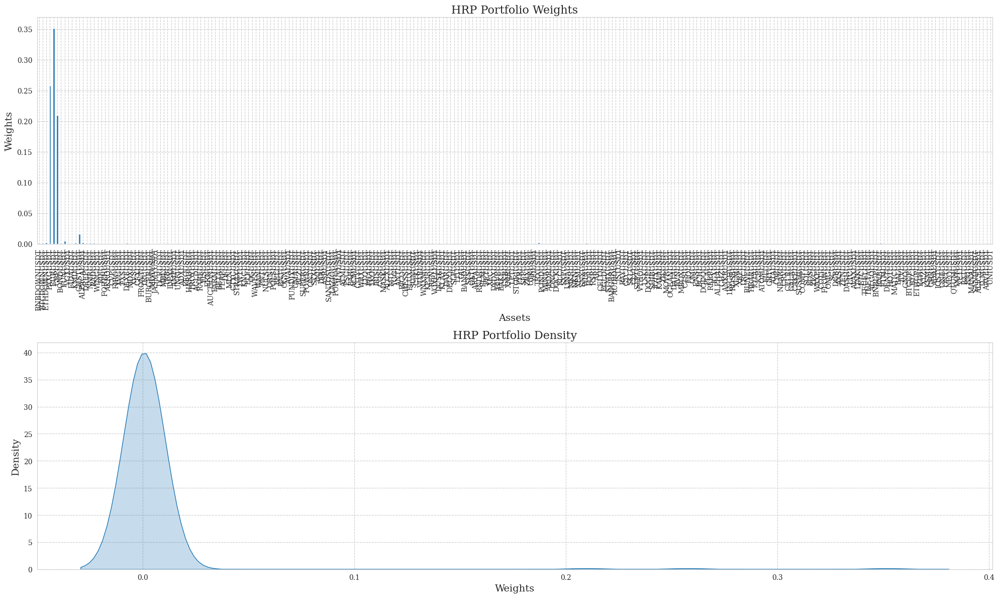

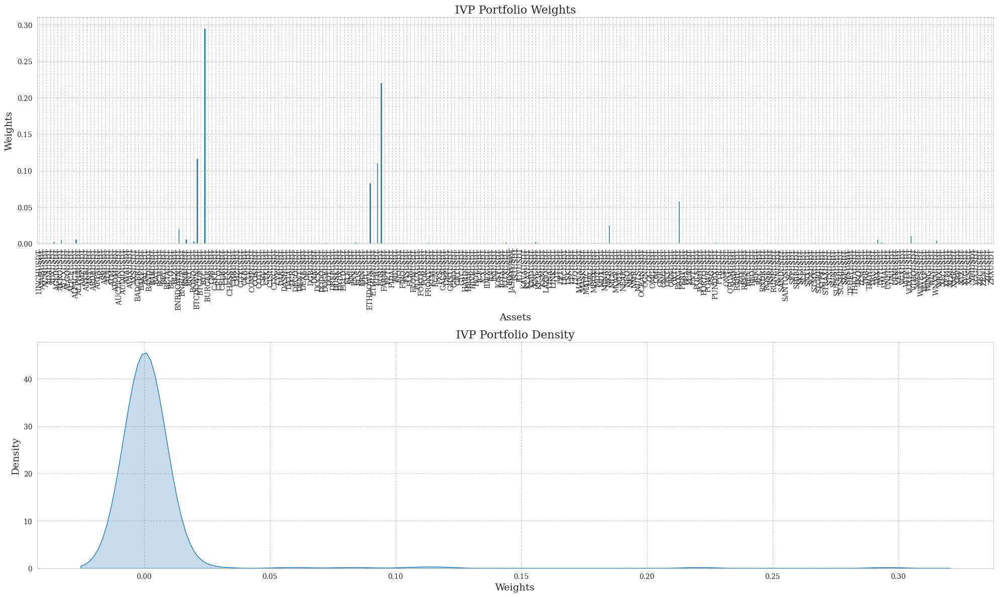

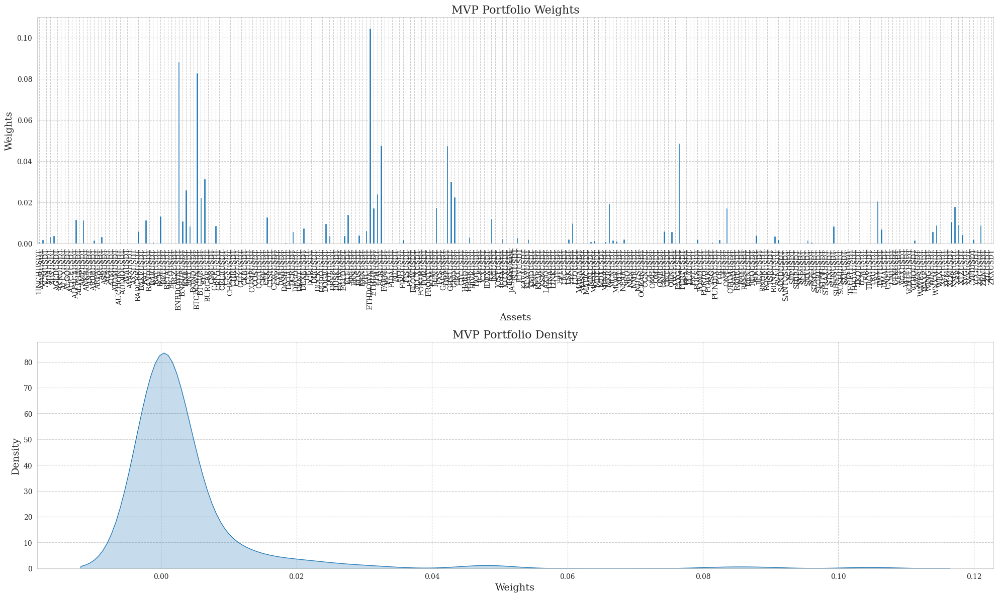

In [22]:
strategies = {"HRP": hrp_new, "IVP": ivp_new, "MVP": mvp_new}

for strategy, weights in strategies.items():
    fig, axes = plt.subplots(2, 1, figsize=(20, 12))
    
    weights.plot(kind="bar", ax=axes[0])
    axes[0].set_title(f"{strategy} Portfolio Weights", fontsize=16)
    axes[0].set_xlabel("Assets", fontsize=14)
    axes[0].set_ylabel("Weights", fontsize=14)
    
    sns.kdeplot(weights, ax=axes[1], fill=True)
    axes[1].set_title(f"{strategy} Portfolio Density", fontsize=16)
    axes[1].set_xlabel("Weights", fontsize=14)
    axes[1].set_ylabel("Density", fontsize=14)
    
    plt.tight_layout()
    plt.show()

In [23]:
total_transactions

{'HRP': 36, 'IVP': 36, 'MVP': 36}

In [24]:
total_costs

{'HRP': np.float64(0.011852290801811202),
 'IVP': np.float64(0.01270935387304986),
 'MVP': np.float64(0.021300928514723275)}

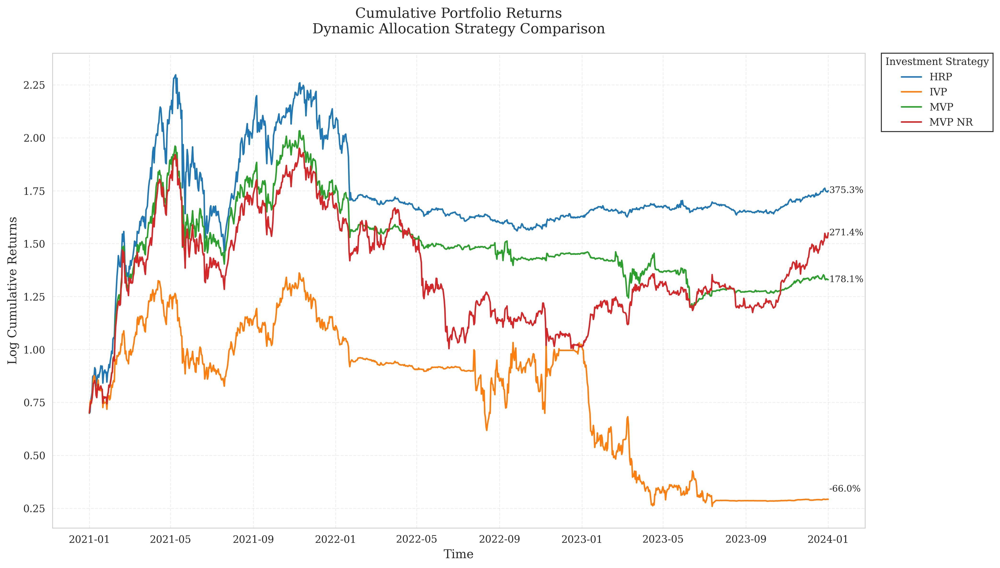

In [25]:
# Add MVP portfolio with no rebalancing to cumulative returns dataframe
cumulative_returns_dynamic["MVP NR"] = cumulative_returns['MVP']

# Set style parameters
sns.set_style("whitegrid", {'grid.linestyle': '--'})
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14

# Create figure with specific dimensions for publication
fig, ax = plt.subplots(figsize=(14, 8), dpi=300)

# Plot cumulative returns with professional color scheme
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
for i, col in enumerate(cumulative_returns_dynamic.columns):
    line = ax.plot(cumulative_returns_dynamic.index, 
                  np.log1p(cumulative_returns_dynamic[col]), 
                  label=col,
                  color=colors[i],
                  linewidth=1.5)
    
    # Add final value annotation with scientific notation
    final_value = (cumulative_returns_dynamic[col].iloc[-1] - 1) * 100
    
    # Add vertical offset for IVP annotation to avoid overlap
    y_offset = 0
    if col == "IVP":
        y_offset = 10
        
    ax.annotate(f'{final_value:.1f}%', 
                xy=(cumulative_returns_dynamic.index[-1], 
                    np.log1p(cumulative_returns_dynamic[col].iloc[-1])),
                xytext=(1, y_offset),
                textcoords='offset points',
                va='center',
                fontsize=9)

# Customize plot elements
ax.set_title("Cumulative Portfolio Returns\nDynamic Allocation Strategy Comparison", 
            pad=20)
ax.set_xlabel("Time")
ax.set_ylabel("Log Cumulative Returns")

# Customize grid
ax.grid(True, linestyle='--', alpha=0.3)

# Customize legend
ax.legend(title="Investment Strategy", 
         bbox_to_anchor=(1.02, 1),
         loc='upper left',
         borderaxespad=0,
         frameon=True,
         fancybox=False,
         edgecolor='black')

# Adjust layout and display
plt.tight_layout()
plt.show()

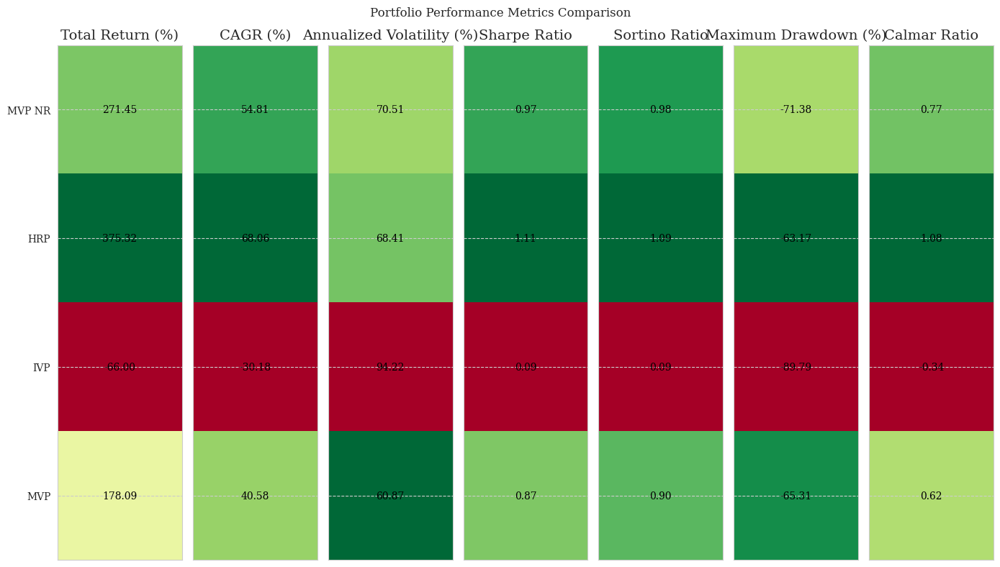

In [26]:
# calculate_performance_metrics(returns_matrix=None, weights=None, portfolio_returns=None, cumulative_returns=None)
metrics_dict = {
    'MVP NR': metrics_dict['MVP'],
    'HRP': calculate_performance_metrics(portfolio_returns=portfolio_returns_dynamic['HRP'], cumulative_returns=cumulative_returns_dynamic['HRP']),
    'IVP': calculate_performance_metrics(portfolio_returns=portfolio_returns_dynamic['IVP'], cumulative_returns=cumulative_returns_dynamic['IVP']),
    'MVP': calculate_performance_metrics(portfolio_returns=portfolio_returns_dynamic['MVP'], cumulative_returns=cumulative_returns_dynamic['MVP'])
}

plot_performance_metrics(metrics_dict);